# Macro demand-based rates strategies

This notebook serves as an illustration of the points discussed in the post [“Macro demand-based rates strategies”](https://research.macrosynergy.com/macro-demand-based-rates-strategies/) available on the Macrosynergy website.

The pace of aggregate demand in the macroeconomy exerts pressure on interest rates. In credible inflation targeting regimes, excess demand should be negatively related to duration returns and positively to curve-flattening returns. Indeed, point-in-time market information states of various macro demand-related indicators have all helped predict rates direction and curve changes across developed and emerging markets. The predictive power of an equally weighted composite demand score has been highly significant at a monthly or quarterly frequency, and the economic value of related strategies has been sizeable.


This notebook provides the essential code required to replicate the analysis discussed in the post.

The notebook covers the three main parts:

- Get Packages and JPMaQS Data: This section is responsible for installing and importing the necessary Python packages used throughout the analysis.

- Transformations and Checks: In this part, the notebook performs calculations and transformations on the data to derive the relevant signals and targets used for the analysis, including the normalization of feature variables using z-score or building simple linear composite indicators.

- Value Checks: This is the most critical section, where the notebook calculates and implements the trading strategies based on the hypotheses tested in the post. This section involves backtesting two simple but powerful trading strategies targeting rates returns. In particular, the post investigates the predictive power of aggregate demand score for predicting subsequent IRS receiver returns, and the predictive power of point-in-time aggregate demand score on the returns on a curve-flattening trade. 


It is important to note that while the notebook covers a selection of indicators and strategies used for the post’s main findings, users can explore countless other possible indicators and approaches. Users can modify the code to test different hypotheses and strategies based on their research and ideas. Best of luck with your research!

## Get packages and JPMaQS data

This notebook primarily relies on the standard packages available in the Python data science stack. However, there is an additional package `macrosynergy` that is required for two purposes:

- Downloading JPMaQS data: The `macrosynergy` package facilitates the retrieval of JPMaQS data, which is used in the notebook.

- For the analysis of quantamental data and value propositions: The `macrosynergy` package provides functionality for performing quick analyses of quantamental data and exploring value propositions.

For detailed information and a comprehensive understanding of the `macrosynergy` package and its functionalities, please refer to the [“Introduction to Macrosynergy package”](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php) notebook on the Macrosynergy Quantamental Academy or visit the following link on [Kaggle](https://www.kaggle.com/code/macrosynergy/introduction-to-macrosynergy-package).

In [1]:
# Run only if needed!
"""
%%capture
! pip install macrosynergy --upgrade"""

'\n%%capture\n! pip install macrosynergy --upgrade'

In [2]:
import numpy as np
import pandas as pd
from pandas import Timestamp
import matplotlib.pyplot as plt
import seaborn as sns
import os

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.signal as mss
import macrosynergy.pnl as msn

from macrosynergy.download import JPMaQSDownload

import warnings

warnings.simplefilter("ignore")

In [3]:
# Cross sections

cids_dm = ["AUD", "CAD", "CHF", "EUR", "GBP", "JPY", "NOK", "NZD", "SEK", "USD"]
cids_em = [
    "CLP",
    "CNY",
    "COP",
    "CZK",
    "HKD",
    "HUF",
    "IDR",
    "ILS",
    "INR",
    "KRW",
    "MXN",
    "PLN",
    "RON",
    "RUB",
    "SGD",
    "THB",
    "TRY",
    "TWD",
    "ZAR",
]
cids = cids_dm + cids_em

cids_wild = ["CNY", "HKD", "RON", "RUB", "SGD"]
cids_emx = list(set(cids_em) - set(cids_wild))
cids_du = cids_dm + cids_emx
cids_dux = list(set(cids_du) - set(["IDR", "NZD"]))

In [4]:
# Category tickers

heads = [
    # Import growth
    "IMPORTS_SA_P6M6ML6AR",
    "IMPORTS_SA_P1M1ML12_3MMA",
    # GDP growth trends
    "INTRGDPv5Y_NSA_P1M1ML12_3MMA",
    "RGDPTECHv5Y_SA_P1M1ML12_3MMA",
    # Retail sales growth
    "NRSALES_SA_P1M1ML12_3MMA",
    "NRSALES_SA_P1Q1QL4",
    "RRSALES_SA_P1M1ML12_3MMA",
    "RRSALES_SA_P1Q1QL4",
    # Private credit growth
    "PCREDITBN_SJA_P1M1ML12",
    "PCREDITGDP_SJA_D1M1ML12"
]

benchs = [
    "INFTARGET_NSA",
    "RGDP_SA_P1Q1QL4_20QMA",
    "PCREDITGDP_SA",
]

main = heads + benchs

rets = [
    "DU02YXR_NSA",
    "DU02YXR_VT10",
    "DU05YXR_NSA",
    "DU05YXR_VT10",
]

xcats = main + rets
xtix = ["USD_GB10YXR_NSA", "USD_EQXR_NSA"]

The description of each JPMaQS category is available under [Macro quantamental academy](https://academy.macrosynergy.com/quantamental-indicators/) or [JPMorgan Markets](https://markets.jpmorgan.com/#jpmaqs) (password protected). For tickers used in this notebook see [Foreign trade trends](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Foreign%20trade%20trends.php?highlight=imports_sa_), [Technical GDP growth estimates](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Technical%20GDP%20growth%20estimates.php), [Intuitive GDP growth estimates](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Intuitive%20GDP%20growth%20estimates.php), [Private credit expansion](https://academy.macrosynergy.com/academy/Themes/Financial%20conditions/_build/html/notebooks/Private%20credit%20expansion.php?highlight=pcreditgdp),[Inflation targets](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Inflation%20targets.php?highlight=infteff), [Private consumption](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Private%20consumption.php?highlight=nrsales), and [Duration returns](https://academy.macrosynergy.com/academy/Themes/Generic%20returns/_build/html/notebooks/Duration%20returns.php)

In [5]:

tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + xtix
print(f"Maximum number of tickers is {len(tickers)}") 


# Download series from J.P. Morgan DataQuery by tickers

client_id: str = os.getenv("DQ_CLIENT_ID")
client_secret: str = os.getenv("DQ_CLIENT_SECRET")

with JPMaQSDownload(client_id=client_id, client_secret=client_secret) as dq:
    df = dq.download(
        tickers=tickers,
        start_date="2000-01-01",
        suppress_warning=True,
        metrics=[
            "value",
        ],
        show_progress=True,
    )

Maximum number of tickers is 495
Timestamp UTC:  2024-02-22 16:26:55
Connection successful!


Requesting data: 100%|██████████| 25/25 [00:05<00:00,  4.95it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list. 
82 out of 495 expressions are missing.To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the  call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 6301 dates are missing.


The JPMaQS indicators we consider are downloaded using the J.P. Morgan Dataquery API interface within the `macrosynergy` package. This is done by specifying ticker strings, formed by appending an indicator category code <category> to a currency area code <cross_section>. These constitute the main part of a full quantamental indicator ticker, taking the form `DB(JPMAQS,<cross_section>_<category>,<info>)`, where <info> denotes the time series of information for the given cross-section and category. The following types of information are available:

`value` giving the latest available values for the indicator
`eop_lag` referring to days elapsed since the end of the observation period
`mop_lag` referring to the number of days elapsed since the mean observation period
`grade` denoting a grade of the observation, giving a metric of real-time information quality.

After instantiating the `JPMaQSDownload` class within the `macrosynergy.download` module, one can use the `download(tickers,start_date,metrics)` method to easily download the necessary data, where `tickers` is an array of ticker strings, `start_date` is the first collection date to be considered and `metrics` is an array comprising the times series information to be downloaded. For more information see [here](https://github.com/macrosynergy/macrosynergy/blob/develop/README.md)

In [6]:
scols = ["cid", "xcat", "real_date", "value"]  # required columns
dfx = df[scols].copy()
dfx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2402907 entries, 0 to 2402906
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   cid        object        
 1   xcat       object        
 2   real_date  datetime64[ns]
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 73.3+ MB


### Blacklist dictionary

As the first step, we take out bad data return periods for fixed-income markets. To check the rationality behind this removal, please see the period of non-tradability for TRY:

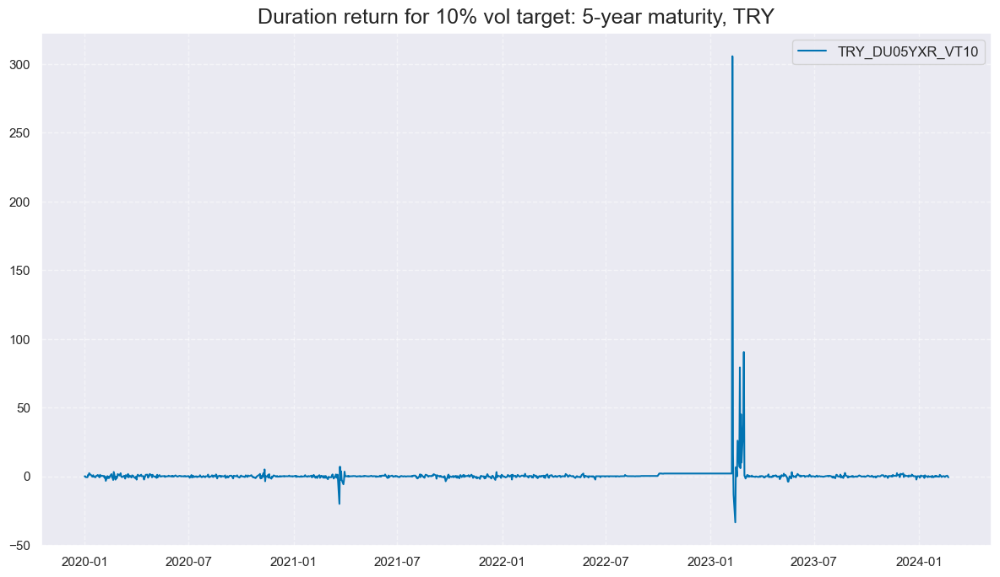

In [7]:
msp.view_timelines(
    df,
    xcats=["DU05YXR_VT10"],
    cids=["TRY"],
    cumsum=False,
    start="2020-01-01",
    same_y=False,
    all_xticks=True,
    title="Duration return for 10% vol target: 5-year maturity, TRY",
)

dublack = {"TRY": (Timestamp("2020-01-01 00:00:00"), Timestamp("2100-01-01 00:00:00"))}

### Availability

It is important to assess data availability before conducting any analysis. It allows identifying any potential gaps or limitations in the dataset, which can impact the validity and reliability of analysis and ensure that a sufficient number of observations for each selected category and cross-section is available and determining the appropriate time periods for analysis. 

- Australia (AUD), New Zealand (NZD), and the Philippines (PHP) exclusively release quarterly data for nominal and real retail sales growth.

- In contrast, Chile (CLP), Indonesia (IDR), Israel (ILS), Mexico (MXN), Malaysia (MYR), Romania (RON), Singapore (SGD), and Taiwan (TWD) do not provide nominal retail sales data, focusing solely on real retail sales growth.

To maintain uniformity with other countries, we will rename the quarterly growth figures as 3-Month Moving Averages, involving a modification to the ticker's final segment from "_P1Q1QL4" to "_P1M1ML12_3MMA" for both nominal and real retail sales growth indicators.

In [8]:
dict_repl = {
    "NRSALES_SA_P1Q1QL4": "NRSALES_SA_P1M1ML12_3MMA",
    "RRSALES_SA_P1Q1QL4": "RRSALES_SA_P1M1ML12_3MMA",    
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

[check_availability()](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#view-available-data-history-with-check-availability) functions list visualizes start years and the number of missing values at or before the end date of all selected cross-sections and across a list of categories. It also displays unavailable indicators as gray fields and color codes for the starting year of each series, with darker colors indicating more recent starting years. 

The function [missing_in_df()](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#detect-missing-categories-or-cross-sections-with-missing-in-df) is complimentary to check_availability and simply displays (1) categories that are missing across all expected cross-sections for a given category name list, and (2) cross-sections that are missing within a category.

In [9]:
msm.missing_in_df(dfx, xcats=main, cids=cids_du)

Missing xcats across df:  ['NRSALES_SA_P1Q1QL4', 'RRSALES_SA_P1Q1QL4']
Missing cids for IMPORTS_SA_P1M1ML12_3MMA:  []
Missing cids for IMPORTS_SA_P6M6ML6AR:  []
Missing cids for INFTARGET_NSA:  []
Missing cids for INTRGDPv5Y_NSA_P1M1ML12_3MMA:  []
Missing cids for NRSALES_SA_P1M1ML12_3MMA:  ['TWD', 'CLP', 'IDR', 'MXN', 'INR', 'ILS']
Missing cids for PCREDITBN_SJA_P1M1ML12:  []
Missing cids for PCREDITGDP_SA:  []
Missing cids for PCREDITGDP_SJA_D1M1ML12:  []
Missing cids for RGDPTECHv5Y_SA_P1M1ML12_3MMA:  []
Missing cids for RGDP_SA_P1Q1QL4_20QMA:  []
Missing cids for RRSALES_SA_P1M1ML12_3MMA:  ['INR']


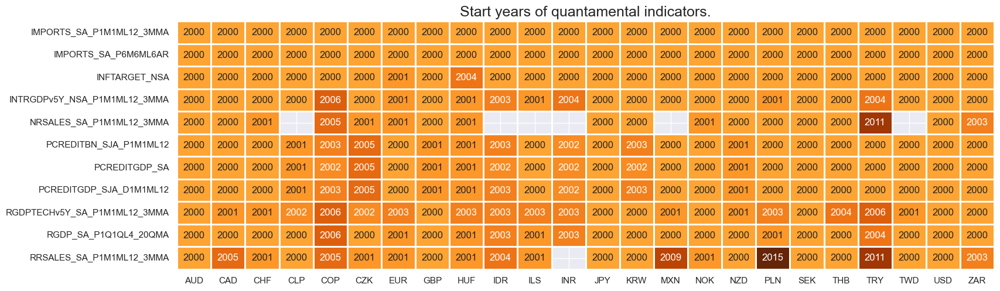

In [10]:
msm.check_availability(dfx, xcats=main, cids=cids_du, missing_recent=False)

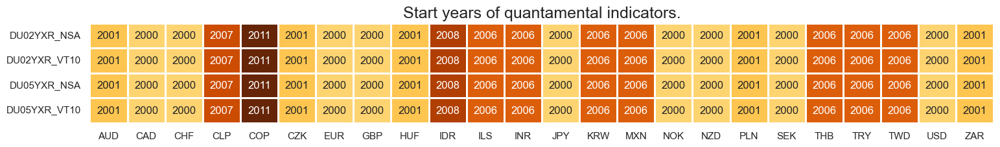

In [11]:
msm.check_availability(dfx, xcats=rets, cids=cids_du, missing_recent=False)

## Transformations and checks

### Features

#### Excess GDP growth

The first group of potential feature indicator come straight from the JPMaQS database and does not require any modification apart from normalization (at a later point). Here we simply plot [ Intuitive real GDP growth: % oya, 3mma](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Intuitive%20GDP%20growth%20estimates.php) and [Excess technical real GDP growth trend, % oya, 3mma: based on 5-year lookback](https://academy.macrosynergy.com/academy/Themes/Economic%20trends/_build/html/notebooks/Technical%20GDP%20growth%20estimates.php) with the help of [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package:

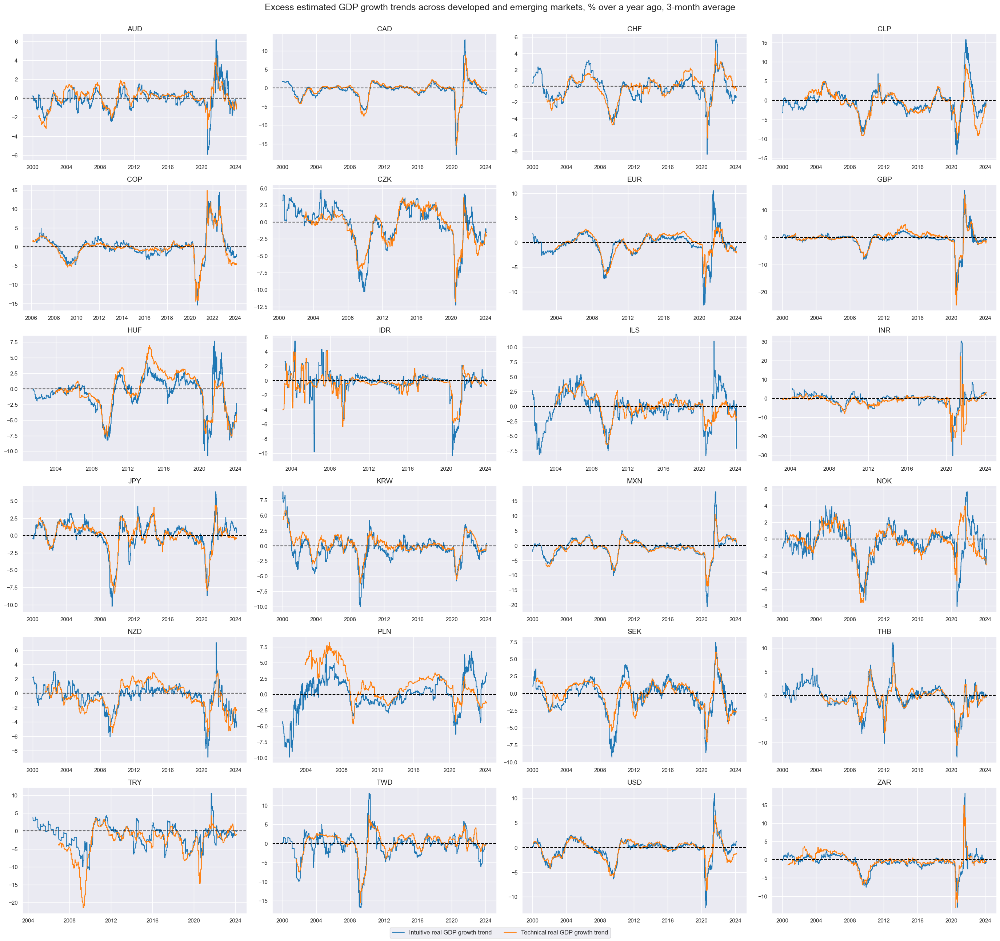

In [12]:
xcatx = ["INTRGDPv5Y_NSA_P1M1ML12_3MMA", "RGDPTECHv5Y_SA_P1M1ML12_3MMA"]
cidx = cids_du
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Excess estimated GDP growth trends across developed and emerging markets, % over a year ago, 3-month average",
    xcat_labels=[
        "Intuitive real GDP growth trend",
        "Technical real GDP growth trend",
    ],
   )

Both technical and intuitive growth indicators are normalized using z-scores. This process standardizes the data, making it easier to compare different countries on the same scale. The function [`make_zn_score()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores) is part of `macrosynergy` package. We select here five years as the minimum observation period and a threshold of 3  for winsorization in terms of standard deviations:

In [13]:
xgrts = ["INTRGDPv5Y_NSA_P1M1ML12_3MMA", "RGDPTECHv5Y_SA_P1M1ML12_3MMA"]
xcatx = xgrts
cidx = cids_du

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=0,
        #thresh=3,
        postfix="_ZN",
        est_freq="m",
        blacklist=dublack,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

With the help of simple but very useful function [`linear_composite()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#calculate-linear-combinations-of-panels-with-linear-composite) we create a linear combination (equally weighted) of the two growth z-scores. The new indicator will be called `XGRT_ZNC`

In [14]:
xcatx = [x + "_ZN" for x in xgrts]
cidx = cids_du
sdate = "2000-01-01"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    start=sdate,
    new_xcat="XGRT_ZNC",
)

dfx = msm.update_df(dfx, dfa)

#### Excess retail sales growth

The second group of potential features will be excess retail sales growth indicators. We define for these purposes: 
-   Excess nominal retail sales growth as the difference between nominal retail sales growth in local currency and the sum of medium-term GDP growth (5-year rolling median) and the official or implied inflation target. 
-   Excess real retail sales are the difference between real retail sales growth and medium-term GDP growth

In [15]:
calcs = [
    "NRSALES_SA_P1M1ML12_3MMAvNG = NRSALES_SA_P1M1ML12_3MMA - INFTARGET_NSA - RGDP_SA_P1Q1QL4_20QMA",
    "RRSALES_SA_P1M1ML12_3MMAvRG = RRSALES_SA_P1M1ML12_3MMA - RGDP_SA_P1Q1QL4_20QMA",
]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_du)
dfx = msm.update_df(dfx, dfa)

xsales = list(dfa["xcat"].unique())

Here we simply plot newly created excess nominal retail sale growth and excess real retail sale growth with the help of [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package:

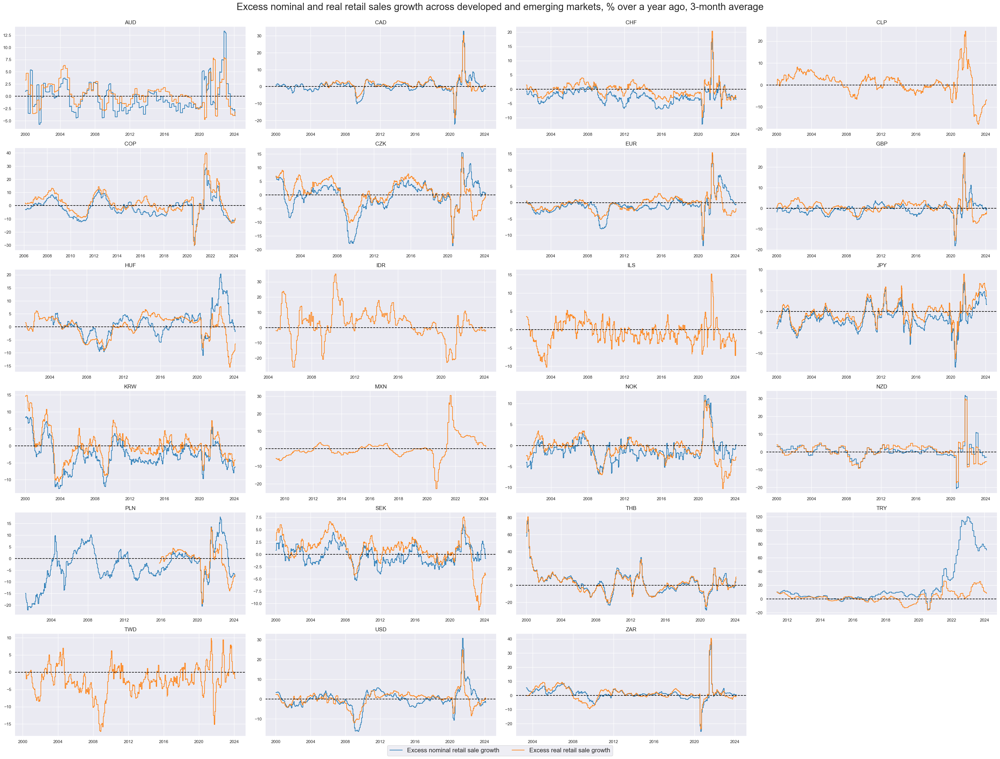

In [16]:
xcatx = xsales
cidx = cids_du
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    aspect=2,
    height=3,
    all_xticks=True,
    title="Excess nominal and real retail sales growth across developed and emerging markets, % over a year ago, 3-month average",
    title_fontsize=25,
    xcat_labels=[
        "Excess nominal retail sale growth",
        "Excess real retail sale growth",
    ],
    legend_fontsize=16,
)

As before, for technical and intuitive growth indicators, we normalize excess retail growth indicators using z-scores. This process standardizes the data, making comparing different countries on the same scale easier. The function [`make_zn_score()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores) is part of `macrosynergy` package. We select here five years as the minimum observation period and a threshold of 3  for winsorization in terms of standard deviations:

In [17]:
xcatx = xsales
cidx = cids_du

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
        blacklist=dublack,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

With the help of [`linear_composite()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#calculate-linear-combinations-of-panels-with-linear-composite) we create a linear combination (equally weighted) of the two excess sales growth z-scores. The new indicator will be called  `XRSALES_ZNC`

In [18]:
xcatx = [x + "_ZN" for x in xsales]
cidx = cids_du
sdate = "2000-01-01"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    start=sdate,
    new_xcat="XRSALES_ZNC",
)

dfx = msm.update_df(dfx, dfa)

#### Excess private credit growth

The third group of potential features is excess private credit growth. We define for this purpose the following indicators:
-   Simple excess private credit growth is the difference between (a) growth in private bank credit as % over a year ago and (b) the sum of medium-term real GDP growth and the inflation target.
-   Proportionate excess private credit growth is the difference between (a) the change in private bank credit as % of GDP over a year ago and (b) the sum of medium-term real GDP growth and the inflation target, times the share of private credit to GDP.


In [19]:
calcs = [
    "PCREDITBN_SJA_P1M1ML12vNG = PCREDITBN_SJA_P1M1ML12 - INFTARGET_NSA - RGDP_SA_P1Q1QL4_20QMA",
    "PCREDITGDP_SJA_D1M1ML12vNG = PCREDITGDP_SJA_D1M1ML12 - PCREDITGDP_SA * ( INFTARGET_NSA + RGDP_SA_P1Q1QL4_20QMA ) / 100",
]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_du)
dfx = msm.update_df(dfx, dfa)

xpcrs = list(dfa["xcat"].unique())

In [20]:
# Temporary fix of data error

filt_xcat = dfx["xcat"] == "PCREDITGDP_SA"
filt_cid = dfx["cid"] == "COP"
dfx.loc[filt_xcat & filt_cid, "value"] = 40

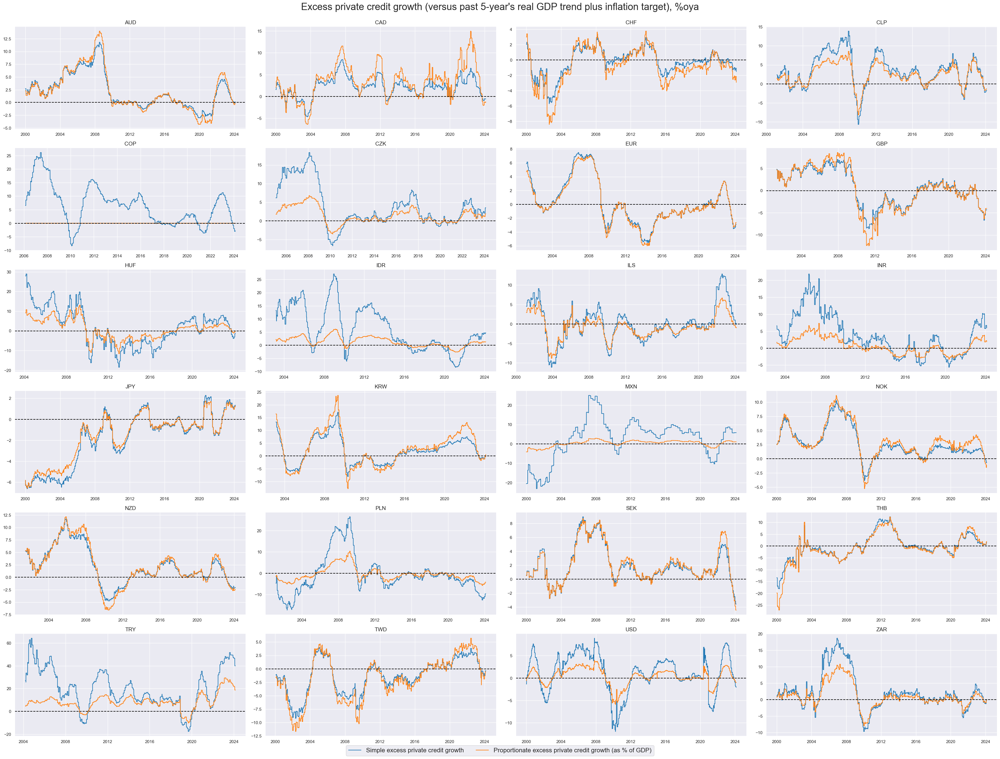

In [21]:
xcatx = xpcrs
cidx = cids_du
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    aspect=2,
    height=3,
    all_xticks=True,
    title="Excess private credit growth (versus past 5-year's real GDP trend plus inflation target), %oya",
    title_fontsize=25,
    xcat_labels=[
        "Simple excess private credit growth",
        "Proportionate excess private credit growth (as % of GDP)",
    ],
    legend_fontsize=16,
)

As before, for other features, we normalize excess private credit growth indicators using z-scores. This process standardizes the data, making it easier to compare different countries on the same scale. The function [`make_zn_score()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores) is part of `macrosynergy` package. We select here five years as the minimum observation period and a threshold of 3  for winsorization in terms of standard deviations:

In [22]:
xcatx = xpcrs
cidx = cids_du

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
        blacklist=dublack,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

With the help of [`linear_composite()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#calculate-linear-combinations-of-panels-with-linear-composite) we create a linear combination (equally weighted) of the two excess credit growth z-scores. The new indicator will be called  `XPCRG_ZNC`

In [23]:
xcatx = [x + "_ZN" for x in xpcrs]
cidx = cids_du
sdate = "2000-01-01"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    start=sdate,
    new_xcat="XPCRG_ZNC",
)

dfx = msm.update_df(dfx, dfa)

#### Excess import growth

The last group of features will include excess merchandise imports. As for retail sales and private credit, excess merchandise import growth is estimated as the difference between outright merchandise import growth and the sum of medium-term GDP growth (5-year rolling median) and the official or implied inflation target.

In [24]:
imps = [
    "IMPORTS_SA_P6M6ML6AR",
    "IMPORTS_SA_P1M1ML12_3MMA",
]

for imp in imps:
    calc_ng = f"{imp}vNG = {imp} - INFTARGET_NSA - RGDP_SA_P1Q1QL4_20QMA"
    dfa = msp.panel_calculator(dfx, calcs=[calc_ng], cids=cids_du)
    dfx = msm.update_df(dfx, dfa)

ximps = [imp + b for imp in imps for b in ["vNG"]] 

As before, the new Excess merchandise import growth indicators are plotted with the help of [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) from the `macrosynergy` package:

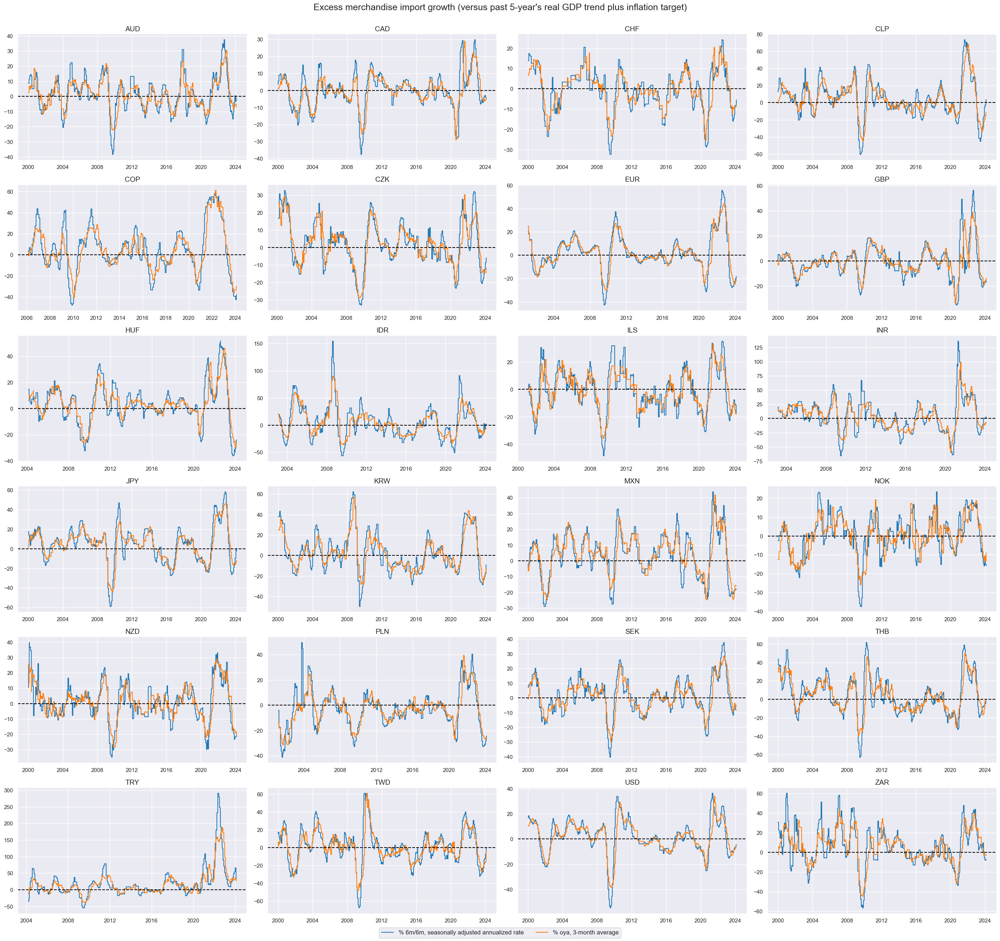

In [25]:
xcatx = ximps
cidx = cids_du
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=False,
    all_xticks=True,
    title="Excess merchandise import growth (versus past 5-year's real GDP trend plus inflation target)",
    xcat_labels=[
        "% 6m/6m, seasonally adjusted annualized rate",
        "% oya, 3-month average",
    ],
    )

As for other features, we normalize excess merchandise import growth indicators using z-scores. This process standardizes the data, making comparing different countries on the same scale easier. The function [`make_zn_score()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#normalize-panels-with-make-zn-scores) is part of `macrosynergy` package. We select here five years as the minimum observation period and a threshold of 3  for winsorization in terms of standard deviations:

In [26]:
xcatx = ximps
cidx = cids_du

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 5,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
        blacklist=dublack,
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

With the help of [`linear_composite()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#calculate-linear-combinations-of-panels-with-linear-composite) we create a linear combination (equally weighted) of the two excess sales growth z-scores. The new indicator will be called  `XIMP_ZNC`

In [27]:
xcatx = [x + "_ZN" for x in ximps]
cidx = cids_du
sdate = "2000-01-01"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    start=sdate,
    new_xcat="XIMP_ZNC",
)

dfx = msm.update_df(dfx, dfa)

#### Composite features

The z-scores for each of the four economic categories: real GDP, retail sales, private credit and merchandise imports are displayed with the help of [`view_timelines()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-panel-time-series-with-view-timelines) function from the `macrosynergy` package:

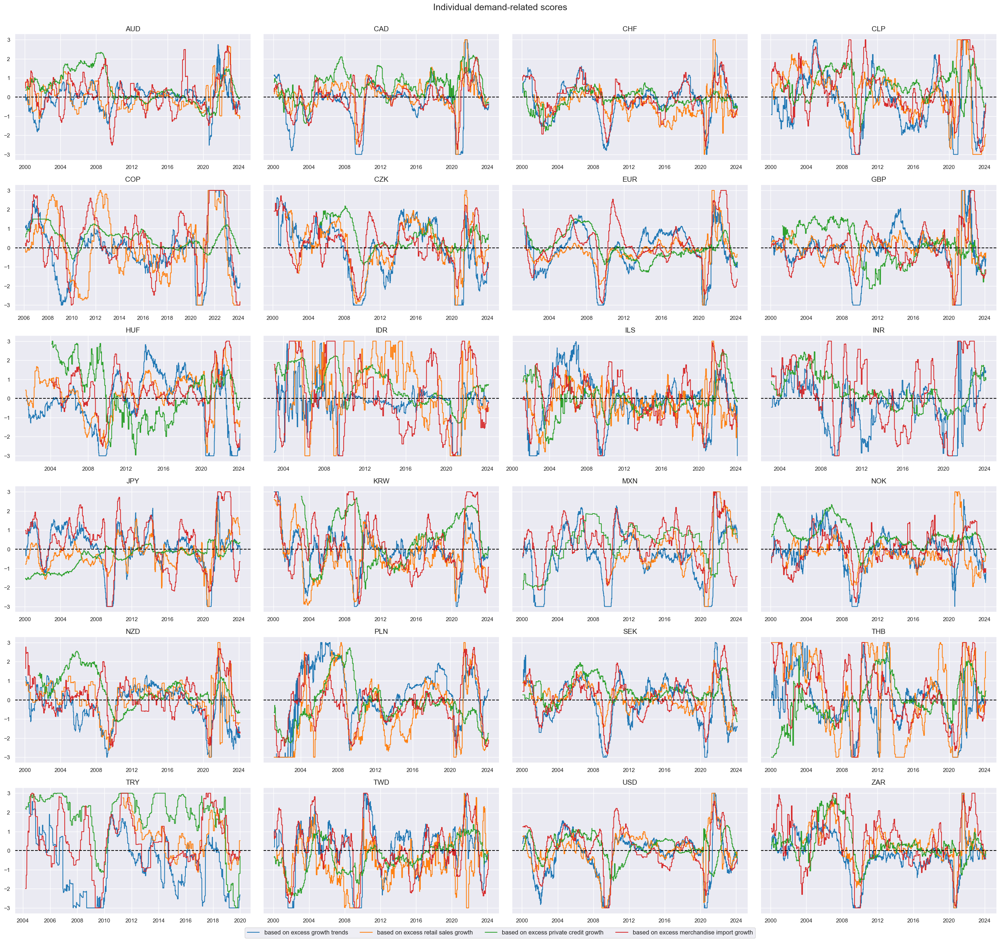

In [28]:
agdems = ["XGRT_ZNC", "XRSALES_ZNC", "XPCRG_ZNC", "XIMP_ZNC"]

xcatx = agdems
cidx = cids_du
sdate = "2000-01-01"

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Individual demand-related scores",
    xcat_labels=[
        "based on excess growth trends",
        "based on excess retail sales growth",
        "based on excess private credit growth",
        "based on excess merchandise import growth",
    ],
)

We then calculate a single aggregate demand score for each of the 24 currency areas. Normalization and aggregation follow the same principles as those applied to the individual category scores. The below panel shows the composite demand scores for each cross-section. The new composite indicator is called `AGDEM_ZNC` and is displayed using `view_timelines()` function 

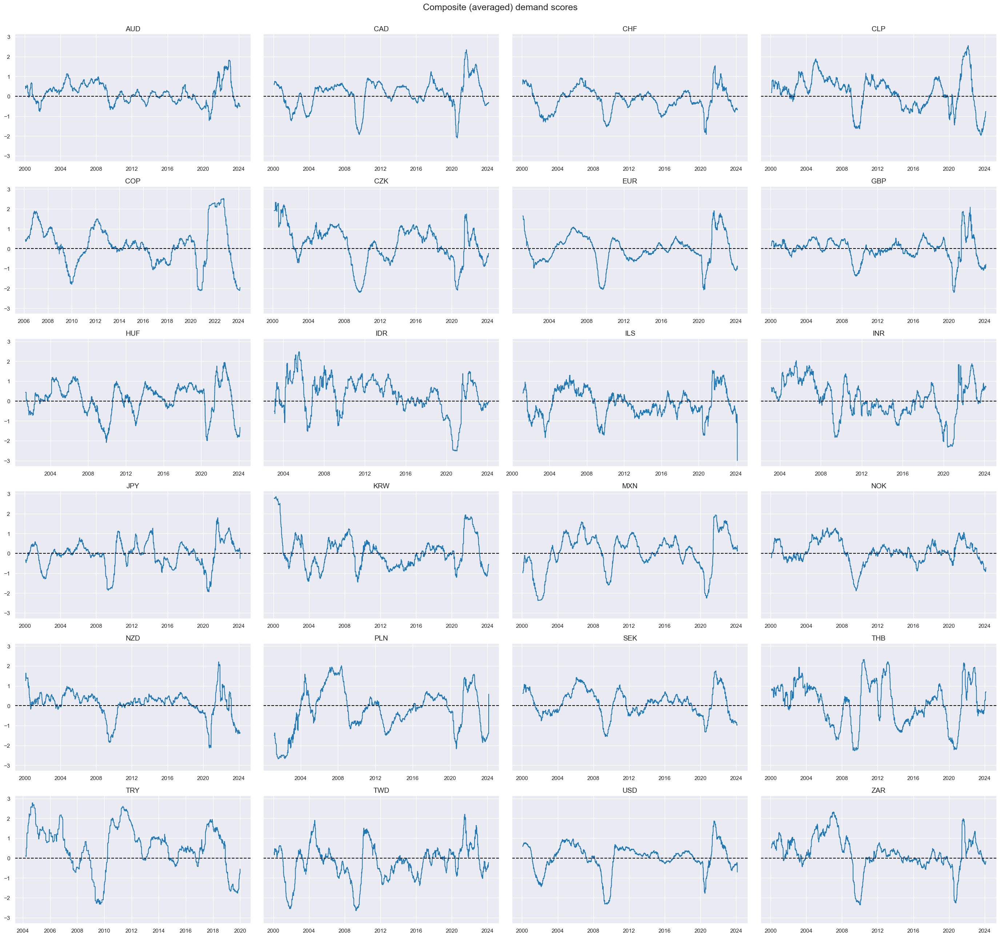

In [29]:
xcatx = agdems
cidx = cids_du
sdate = "2000-01-01"

dfa = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    start=sdate,
    new_xcat="AGDEM_ZNC",
)

dfx = msm.update_df(dfx, dfa)

xcatx = ["AGDEM_ZNC"]

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=False,
    start=sdate,
    same_y=True,
    all_xticks=True,
    title="Composite (averaged) demand scores",
    )

[`correl_matrix()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#visualize-relations-across-sections-or-categories-with-correl-matrix) visualizes Pearson correlations within the composite score across different cross-sections:

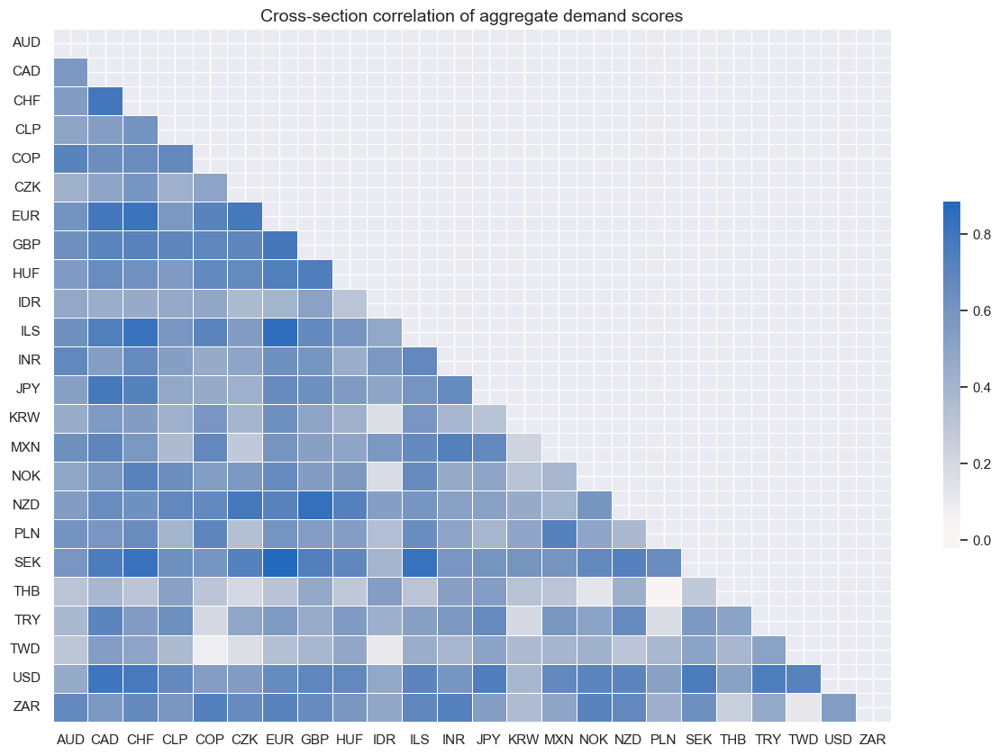

In [30]:
cidx = cids_du

msp.correl_matrix(
    dfx,
    xcats="AGDEM_ZNC",
    freq="Q",
    cids=cidx,
    size=(15, 10),
    cluster=False,
    title="Cross-section correlation of aggregate demand scores",
)

### Targets

The target of the analysis is 5-year IRS fixed receiver returns across the 24 countries, vol-targeted at 10% annualized with monthly rebalancing in each market, and subject to market liquidity and tradability and the difference between 5-year and 2-year IRS fixed receiver returns. The cell below calculates the difference for each cross-section, removes the period of untradability for TRY, and displays the 5-year IRS fixed receiver returns for each cross-section.

In [31]:
# we take out bad-data return periods for fixed income markets
filt_try = (dfx["cid"] == "TRY") & (dfx["real_date"] > pd.to_datetime("2020-08-01"))
dfx.loc[filt_try, "value"] = np.nan

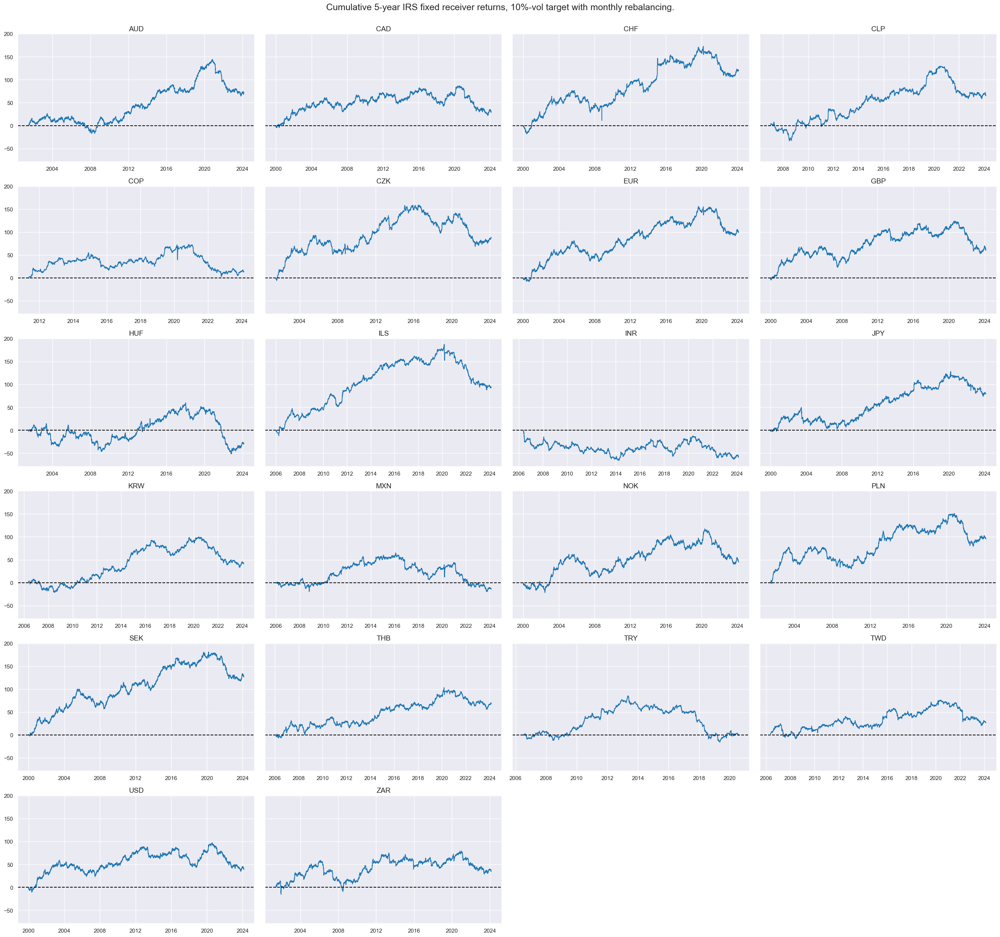

In [32]:
calcs = [
    "DU05YXR_VT10X = DU05YXR_VT10",  # for TRY blacklisting
    "DU05v02YXR_VT10 = DU05YXR_VT10X - DU02YXR_VT10",
]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_du, blacklist=dublack)
dfx = msm.update_df(dfx, dfa)

xcatx = ["DU05YXR_VT10"]
cidx = cids_dux

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    cumsum=True,
    start="2000-01-01",
    same_y=True,
    all_xticks=True,
    title="Cumulative 5-year IRS fixed receiver returns, 10%-vol target with monthly rebalancing.",
    
)

## Value checks

In this part of the analysis, the notebook calculates the naive PnLs (Profit and Loss) for macro demand-based rates strategies using the previously derived demand indicators. The PnLs are calculated based on simple trading strategies that utilize the yields as signals (no regression is involved). The strategies involve going long (buying) or short (selling) of rates positions based purely on the direction of the score signals.

To evaluate the performance of these strategies, the notebook computes various metrics and ratios, including:

- Correlation: Measures the relationship between the changes in real yields and consequent bond returns. Positive correlations indicate that the strategy moves in the same direction as the market, while negative correlations indicate an opposite movement.

- Accuracy Metrics: These metrics assess the accuracy of the confidence score based strategies in predicting market movements. Common accuracy metrics include accuracy rate, balanced accuracy, precision, etc.

- Performance Ratios: Various performance ratios, such as Sharpe ratio, Sortino ratio, Max draws, etc.

This notebook investigates two hypotheses: 

- the negative effect aggregate demand score for subsequent IRS receiver returns, and 
- the positive effect of point-in-time aggregate demand score on the returns on a curve-flattening trade. 

The notebook compares the performance of these simple demand score strategies with the long-only performance of the IRS fixed receiver returns, 10% vol targeted with monthly rebalancing. 

It's important to note that the analysis deliberately disregards transaction costs and risk management considerations. This is done to provide a more straightforward comparison of the strategies' raw performance without the additional complexity introduced by transaction costs and risk management, which can vary based on trading size, institutional rules, and regulations.

### Aggregate demand and subsequent IRS receiver returns from 2000 to 2023 

The below graph displays a panel scatter plot of aggregate demand and subsequent 5-year IRS returns. There has been a strong and highly significant negative relationship at monthly and quarterly frequency.

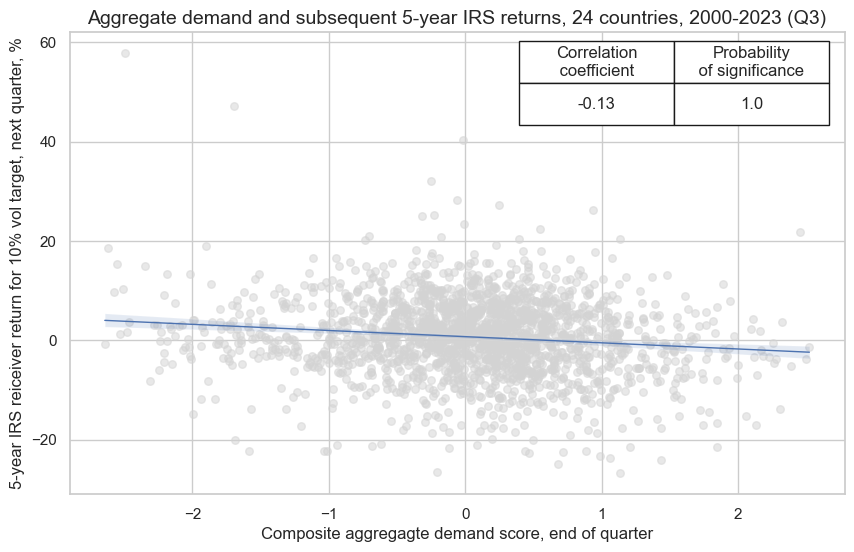

In [33]:
ms = 'AGDEM_ZNC'
oths = agdems # other signals

targ = 'DU05YXR_VT10'
cidx = cids_du
start = "2000-01-01"

dict_pmd = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": dublack,
    "srr": None,
    "pnls": None,
}


dix = dict_pmd

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="upper right",
    title="Aggregate demand and subsequent 5-year IRS returns, 24 countries, 2000-2023 (Q3)",
    xlab="Composite aggregagte demand score, end of quarter",
    ylab="5-year IRS reiceiver return for 10% vol target, next quarter, %",
    size=(10, 6),
    prob_est="map",
)

This negative significant relation seems to be stable, holding across very sub-periods:

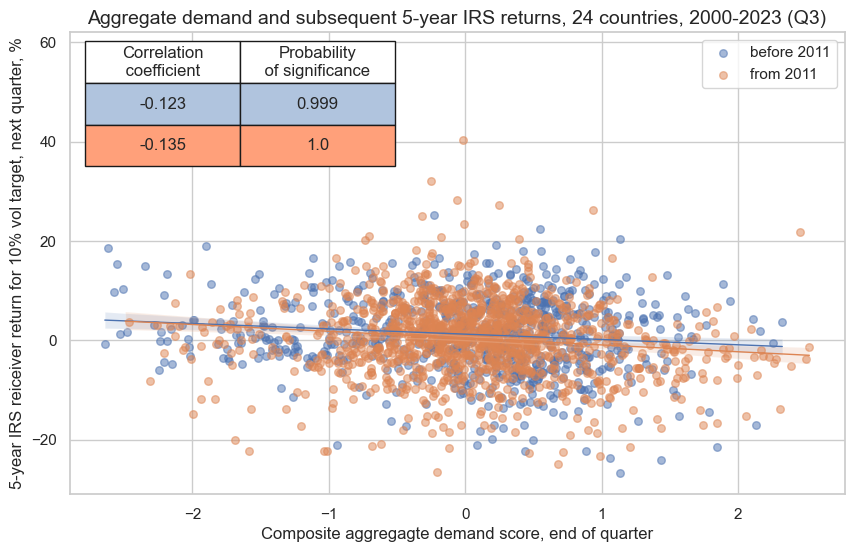

In [34]:
crx.reg_scatter(
    labels=False,
    coef_box="upper left",
    separator=2011,
    title="Aggregate demand and subsequent 5-year IRS returns, 24 countries, 2000-2023 (Q3)",
    xlab="Composite aggregagte demand score, end of quarter",
    ylab="5-year IRS reiceiver return for 10% vol target, next quarter, %",
    size=(10, 6),
    prob_est="map",
)

### Accuracy and correlation check


The `SignalReturnRelations` class from the macrosynergy.signal module is specifically designed to analyze, visualize, and compare the relationships between panels of trading signals and panels of subsequent returns.

In [35]:
sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    sig_neg=[True] * (len(rivs) + 1),
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr


dix = dict_pmd
srrx = dix["srr"]


In [36]:
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
AGDEM_ZNC_NEG,0.517,0.521,0.449,0.544,0.567,0.475,0.093,0.000,0.053,0.000,0.521
XGRT_ZNC_NEG,0.510,0.508,0.526,0.544,0.551,0.464,0.038,0.004,0.023,0.008,0.508
XIMP_ZNC_NEG,0.510,0.514,0.462,0.544,0.559,0.469,0.066,0.000,0.032,0.000,0.514
XPCRG_ZNC_NEG,0.521,0.532,0.383,0.542,0.582,0.483,0.092,0.000,0.063,0.000,0.531
XRSALES_ZNC_NEG,0.532,0.528,0.545,0.545,0.571,0.485,0.082,0.000,0.043,0.000,0.528


### Naive PnL

[`NaivePnl()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl) class is designed to provide a quick and simple overview of a stylized PnL profile of a set of trading signals. The class carries the label naive because its methods do not consider transaction costs or position limitations, such as risk management considerations. This is deliberate because costs and limitations are specific to trading size, institutional rules, and regulations. 

Important options within NaivePnl() function include: 

- `zn_score_pan` option, which transforms raw signals into z-scores around zero value based on the whole panel. The neutral level & standard deviation will use the cross-section of panels. zn-score here means standardized score with zero being the neutral level and standardization through division by mean absolute value. 

- rebalancing frequency (`rebal_freq`) for positions according to signal is chosen monthly,

- rebalancing slippage (`rebal_slip`) in days is 1, which means that it takes one day to rebalance the position and that the new position produces PnL from the second day after the signal has been recorded,

- threshold value (`thresh`) beyond which scores are winsorized, i.e., contained at that threshold. This is often realistic, as risk management and the potential of signal value distortions typically preclude outsized and concentrated positions within a strategy. We apply a threshold of 2.

The function below creates two PnLs: A composite aggregate demand score with postfix `_PZN` and a long-biased composite aggregate demand score with postfix `_PZL`. The latter simply adds a value of 1 to the normalized composite demand score, making the strategy long-biased. 

In [37]:
dix = dict_pmd

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_GB10YXR_NSA"],
)

dict_pnls = {"_PZN": 0, "_PZL": 1}
for k, v in dict_pnls.items():

    for sig in sigx:
        naive_pnl.make_pnl(
            sig,
            sig_neg=True,
            sig_add=v,
            sig_op="zn_score_pan",
            thresh=2,
            rebal_freq="monthly",
            vol_scale=10,
            rebal_slip=1,
            pnl_name=sig + k,
        )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

[`plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#plot-pnls) method plots a line chart of cumulative PnL. The first plot is for Composite aggregate demand score  

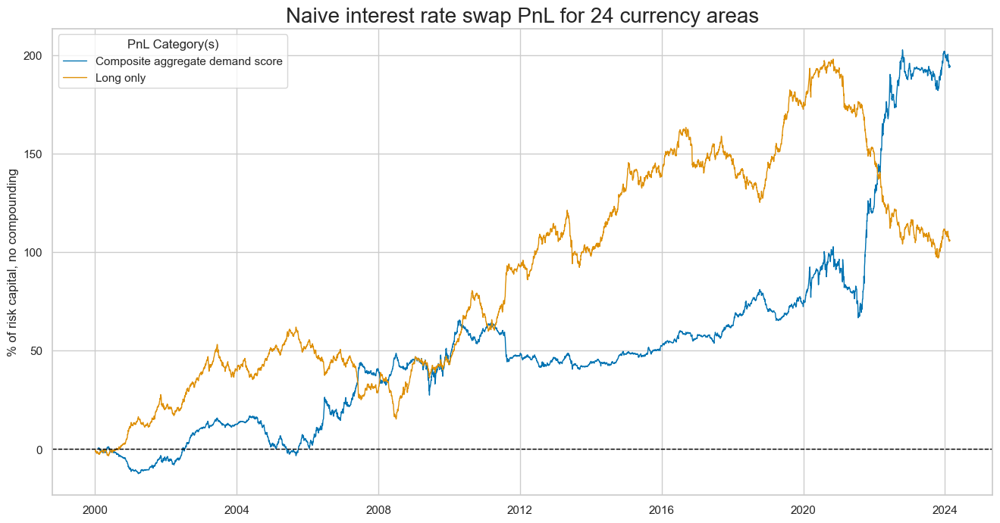

In [38]:
dix = dict_pmd

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sig"]]

naive_pnl = dix["pnls"]

pnls = [s + "_PZN" for s in sigx] + ["Long only"]
naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive interest rate swap PnL for 24 currency areas",
    xcat_labels=["Composite aggregate demand score", "Long only"],
    figsize=(16, 8),
)



The next plot is for the long-biased composite aggregate demand score. (it simply adds a value of 1 to the normalized composite demand score.) 

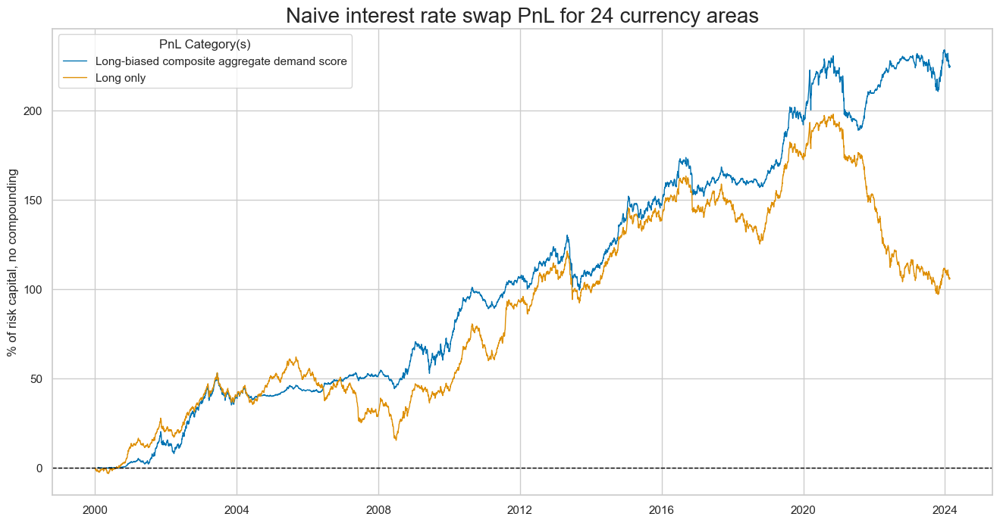

In [39]:
pnls = [s + "_PZL" for s in sigx] + ["Long only"]
naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive interest rate swap PnL for 24 currency areas",
    xcat_labels=["Long-biased composite aggregate demand score", "Long only"],
    figsize=(16, 8),
)

Here, we simply plot PnLs for each sub-score of the aggregate demand composite. Each of the PnLs would have produced a positive value without long bias or outperformed the long-only duration portfolio with long bias. 

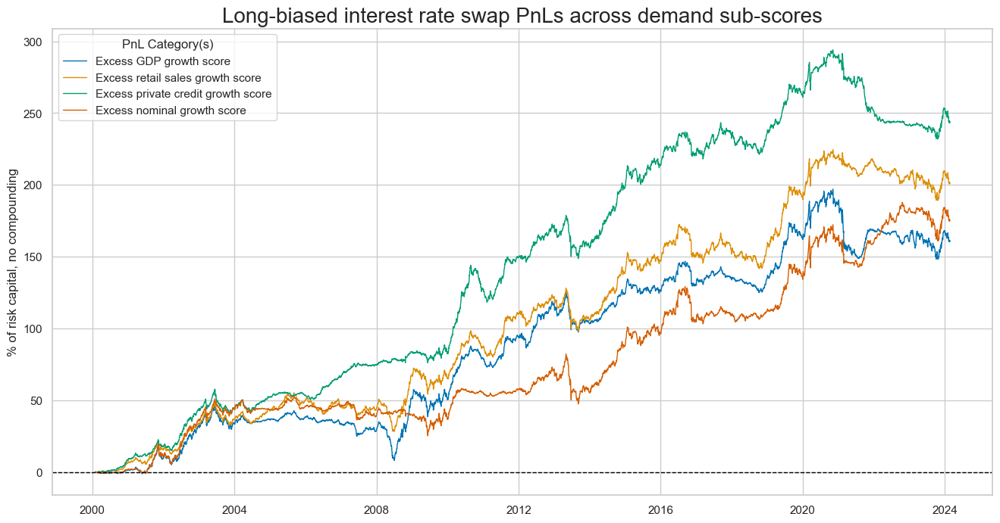

In [40]:
dix = dict_pmd

start = dix["start"]
cidx = dix["cidx"]
sigx = dix["rivs"]

naive_pnl = dix["pnls"]



pnls = [s + "_PZL" for s in sigx]
naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Long-biased interest rate swap PnLs across demand sub-scores",
    xcat_labels=["Excess GDP growth score", 
                 "Excess retail sales growth score", 
                 "Excess private credit growth score", 
                 "Excess nominal growth score"],
    figsize=(16, 8),
)

### Aggregate demand score and curve flattening returns

The second hypothesis to be tested is that the point-in-time aggregate demand score positively predicts the returns on a curve-flattening trade. The targets of the analysis are 5-year IRS fixed receivers versus 2-year IRS payers, with both legs of the trade vol-targeted at a 10% annualized returns to remove systematic directionality of the trade. 

In [41]:
ms = 'AGDEM_ZNC'
oths = agdems # other signals

targ = 'DU05v02YXR_VT10'
cidx = cids_du
start = "2000-01-01"

dict_pmf = {
    "sig": ms,
    "rivs": oths,
    "targ": targ,
    "cidx": cidx,
    "start": start,
    "black": dublack,
    "srr": None,
    "pnls": None,
}

As before, we use [`CategoryRelations()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#investigate-relations-between-panels-with-categoryrelations) function for quick visualization and analysis of two categories, in particular, Composite aggregate demand score, and subsequent 5-year vs. 2-year IRS receiver return, 10% vol each leg:

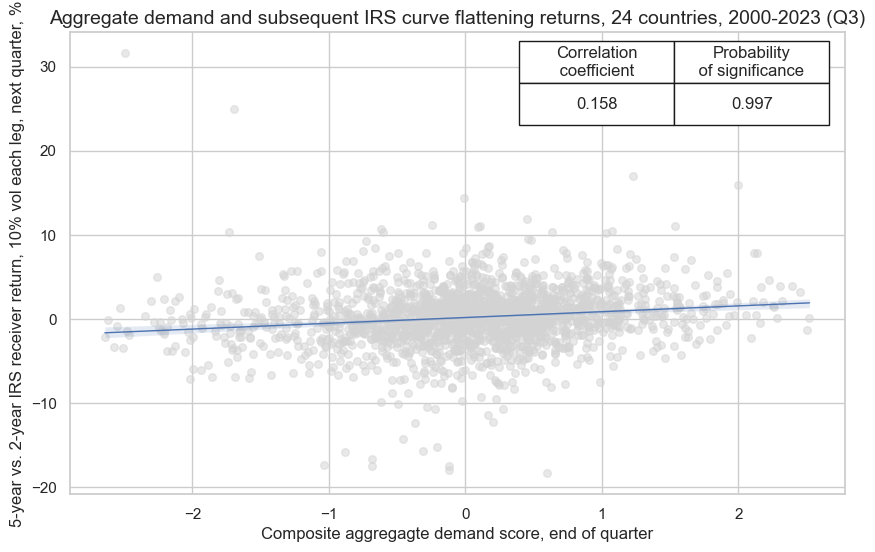

In [42]:
dix = dict_pmf

sig = dix["sig"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

crx = msp.CategoryRelations(
    dfx,
    xcats=[sig, targ],
    cids=cidx,
    freq="Q",
    lag=1,
    xcat_aggs=["last", "sum"],
    start=start,
    blacklist=blax,
)
crx.reg_scatter(
    labels=False,
    coef_box="upper right",
    title="Aggregate demand and subsequent IRS curve flattening returns, 24 countries, 2000-2023 (Q3)",
    xlab="Composite aggregagte demand score, end of quarter",
    ylab="5-year vs. 2-year IRS receiver return, 10% vol each leg, next quarter, %",
    size=(10, 6),
    prob_est="map",
)

Balanced accuracy of monthly return predictions has been higher than for directional IRS return predictions at 53.7%. All sub-scores posted above 50% accuracy and balanced accuracy as well.

In [43]:
dix = dict_pmf

sig = dix["sig"]
rivs = dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

srr = mss.SignalReturnRelations(
    dfx,
    cids=cidx,
    sigs=[sig] + rivs,
    rets=targ,
    freqs="M",
    start=start,
    blacklist=blax,
)

dix["srr"] = srr
srrx = dix["srr"]

In [44]:
display(srrx.signals_table().sort_index().astype("float").round(3))

,accuracy,bal_accuracy,pos_sigr,pos_retr,pos_prec,neg_prec,pearson,pearson_pval,kendall,kendall_pval,auc
AGDEM_ZNC,0.544,0.542,0.551,0.528,0.566,0.518,0.102,0.000,0.081,0.000,0.542
XGRT_ZNC,0.534,0.536,0.474,0.528,0.566,0.506,0.097,0.000,0.070,0.000,0.536
XIMP_ZNC,0.546,0.544,0.538,0.528,0.569,0.520,0.096,0.000,0.083,0.000,0.544
XPCRG_ZNC,0.520,0.514,0.617,0.529,0.540,0.489,0.020,0.132,0.020,0.023,0.514
XRSALES_ZNC,0.520,0.522,0.455,0.524,0.548,0.496,0.064,0.000,0.046,0.000,0.522


#### Naive PnL

As for the first hypothesis, we use [`NaivePnl()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#naivepnl) class to calculate a quick and simple stylized PnL of a set of trading signals. 

We use the same options as for the strategy above: 

- `zn_score_pan` option, which transforms raw signals into z-scores around zero value based on the whole panel. The neutral level & standard deviation will use the cross-section of panels. Zn-score here means standardized score with zero being the neutral level and standardization through division by mean absolute value. 

- rebalancing frequency (rebal_freq) for positions according to signal is chosen monthly,

- rebalancing slippage (rebal_slip) in days is 1, which means that it takes one day to rebalance the position and that the new position produces PnL from the second day after the signal has been recorded,

- threshold value (thresh) beyond which scores are winsorized, i.e., contained at that threshold. This is often realistic, as risk management and the potential of signal value distortions typically preclude outsized and concentrated positions within a strategy. We apply a threshold of 2.

We investigate the same signal - composite aggregate demand score and its components. The targets of the analysis are 5-year IRS fixed receivers versus 2-year IRS payers, with both legs of the trade vol-targeted at a 10% annualized returns to remove systematic directionality of the trade. 

In [45]:
dix = dict_pmf

sigx = [dix["sig"]] + dix["rivs"]
targ = dix["targ"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]

naive_pnl = msn.NaivePnL(
    dfx,
    ret=targ,
    sigs=sigx,
    cids=cidx,
    start=start,
    blacklist=blax,
    bms=["USD_GB10YXR_NSA"],
)

for sig in sigx:
    naive_pnl.make_pnl(
        sig,
        sig_neg=False,
        sig_op="zn_score_pan",
        thresh=2,
        rebal_freq="monthly",
        vol_scale=10,
        rebal_slip=1,
        pnl_name=sig + "_PZN",
    )

naive_pnl.make_long_pnl(vol_scale=10, label="Long only")
dix["pnls"] = naive_pnl

[`plot_pnls()`](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#plot-pnls) method plots a line chart of cumulative PnL for the curve-flattening strategy along with long-only position.

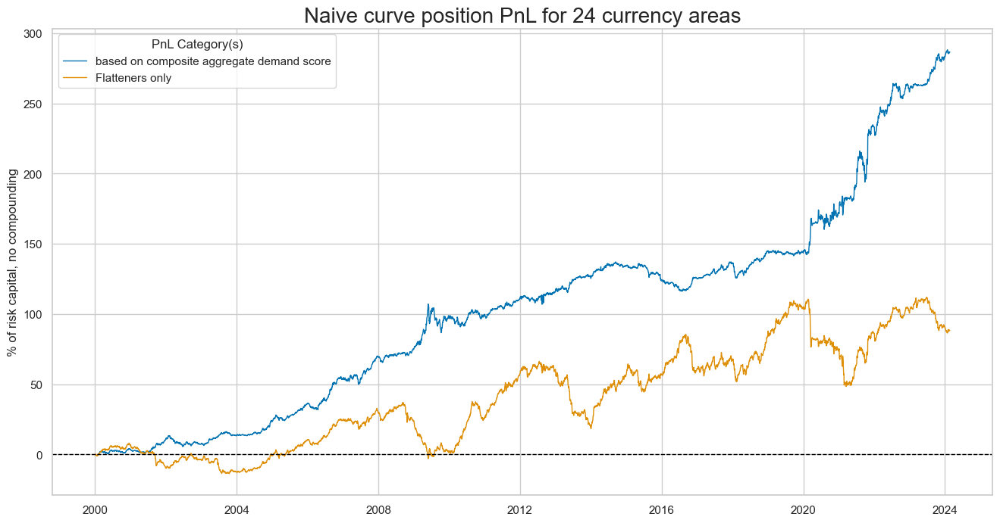

In [46]:
dix = dict_pmf

start = dix["start"]
cidx = dix["cidx"]
sigx = [dix["sig"]]

naive_pnl = dix["pnls"]
pnls = [s + "_PZN" for s in sigx] + ["Long only"]

naive_pnl.plot_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
    title="Naive curve position PnL for 24 currency areas",
    xcat_labels=["based on composite aggregate demand score", "Flatteners only"],
    figsize=(16, 8),
)

The method evaluate_pnls() returns a small dataframe of key PnL statistics. For definitions of Sharpe and Sortino ratios please see [here](https://www.investopedia.com/ask/answers/010815/what-difference-between-sharpe-ratio-and-sortino-ratio.asp#:~:text=The%20Sharpe%20ratio%20indicates%20how,only%20factors%20in%20downside%20risk.)

In [47]:
dix = dict_pmf

start = dix["start"]
sigx = [dix["sig"]] + dix["rivs"]
naive_pnl = dix["pnls"]
pnls = [sig + "_PZN" for sig in sigx]

df_eval = naive_pnl.evaluate_pnls(
    pnl_cats=pnls,
    pnl_cids=["ALL"],
    start=start,
)


In [48]:
display(df_eval.transpose())

,Return (pct ar),St. Dev. (pct ar),Sharpe Ratio,Sortino Ratio,Max 21-day draw,Max 6-month draw,USD_GB10YXR_NSA correl,Traded Months
xcat,,,,,,,,
AGDEM_ZNC_PZN,11.914885,10.0,1.191488,1.804298,-18.505593,-11.093746,-0.001496,290
XGRT_ZNC_PZN,9.609409,10.0,0.960941,1.481509,-16.787981,-12.427022,-0.018404,290
XIMP_ZNC_PZN,11.476181,10.0,1.147618,1.709486,-17.374856,-15.068654,0.006156,290
XPCRG_ZNC_PZN,4.289714,10.0,0.428971,0.583663,-16.592643,-30.519194,0.046323,290
XRSALES_ZNC_PZN,5.644333,10.0,0.564433,0.815922,-27.617096,-33.944873,-0.025967,290


[signal_heatmap() method](https://academy.macrosynergy.com/academy/Introductions/Introduction%20to%20Macrosynergy%20package/_build/html/Introduction%20to%20Macrosynergy%20package.php#signal-heatmap) creates a heatmap of signals for a specific PnL across time and sections. The heatmap provides an intuitive representation of the signal values, allowing the user to identify the patterns and trends across time and sections. Like the directional strategy, the curve strategy posted its higher returns in the 2020s. This is a reminder of the natural seasonality of demand-based strategies. They typically produce their strongest signals in times of large deviations of demand from long-term trends, i.e., in the context of cyclical swings. The 2020-2023 produced large negative and positive signals within a fairly short span of time. By contrast the period 2012-2018 only produced weak signals for the majority of currency areas. 

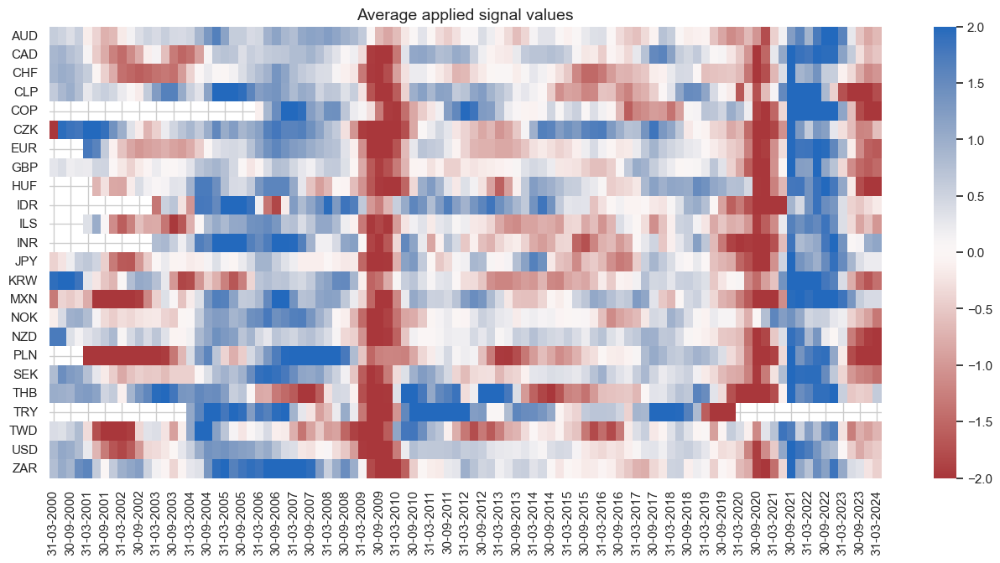

In [49]:
dix = dict_pmf

start = dix["start"]
sig = dix["sig"]
naive_pnl = dix["pnls"]

naive_pnl.signal_heatmap(
    pnl_name=sig + "_PZN", freq="q", start=start, figsize=(16, 7)
)